In [2]:
!pip install -U layoutparser

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.2 MB 888 kB/s 
     |████████████████████████████████| 40 kB 5.6 MB/s 
     |████████████████████████████████| 42 kB 1.4 MB/s 
     |████████████████████████████████| 596 kB 65.8 MB/s 
     |████████████████████████████████| 3.1 MB 62.2 MB/s 
     |████████████████████████████████| 5.6 MB 65.3 MB/s 
     |████████████████████████████████| 142 kB 78.5 MB/s 
     |████████████████████████████████| 4.1 MB 67.5 MB/s 
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31549 sha256=af7565c6bee14ef690da55afe93440aee5b0532ff6c1d33cc0642708cb4225fa
  Stored in directory: /root/.cache/pip/wheels/aa/cc/ed/ca4e88beef656b01c84b9185196513ef2faf74a5a379b043a7
Successfully built iopath
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Att

In [1]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git@v0.6#egg=detectron2' 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git (to revision v0.6) to /tmp/pip-install-9_nqqz6e/detectron2_60cdd0ed69404d71ae5cc0e45d37fa0c
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-install-9_nqqz6e/detectron2_60cdd0ed69404d71ae5cc0e45d37fa0c
  Running command git checkout -q d1e04565d3bec8719335b88be9e9b961bf3ec464


In [2]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!pip install layoutparser[ocr]     

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
!git clone https://github.com/Layout-Parser/layout-parser.git

fatal: destination path 'layout-parser' already exists and is not an empty directory.


In [6]:
%cd layout-parser/

/content/layout-parser


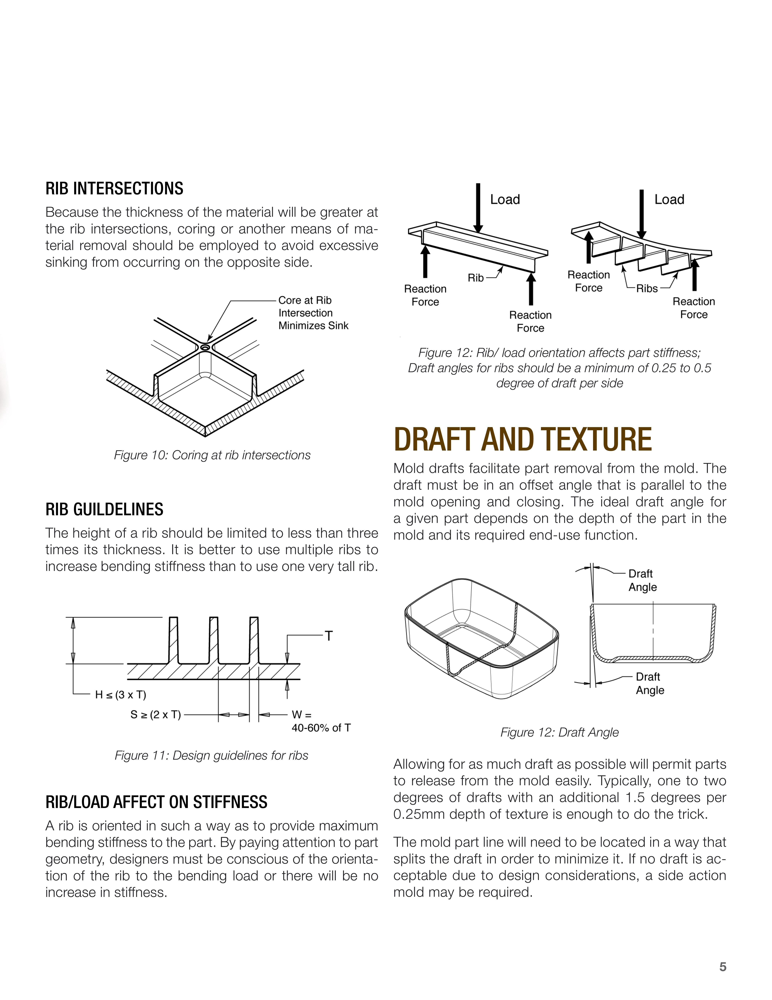

In [33]:
import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/drive/MyDrive/HCLOCR/out4.jpg")
image = image[..., ::-1] 
cv2_imshow(image)
#/content/Injection (1).jpg

In [34]:
import layoutparser as lp
ocr_agent = lp.TesseractAgent(languages='eng') 
model = lp.Detectron2LayoutModel('lp://PubLayNet/mask_rcnn_X_101_32x8d_FPN_3x/config',extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.65],
                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


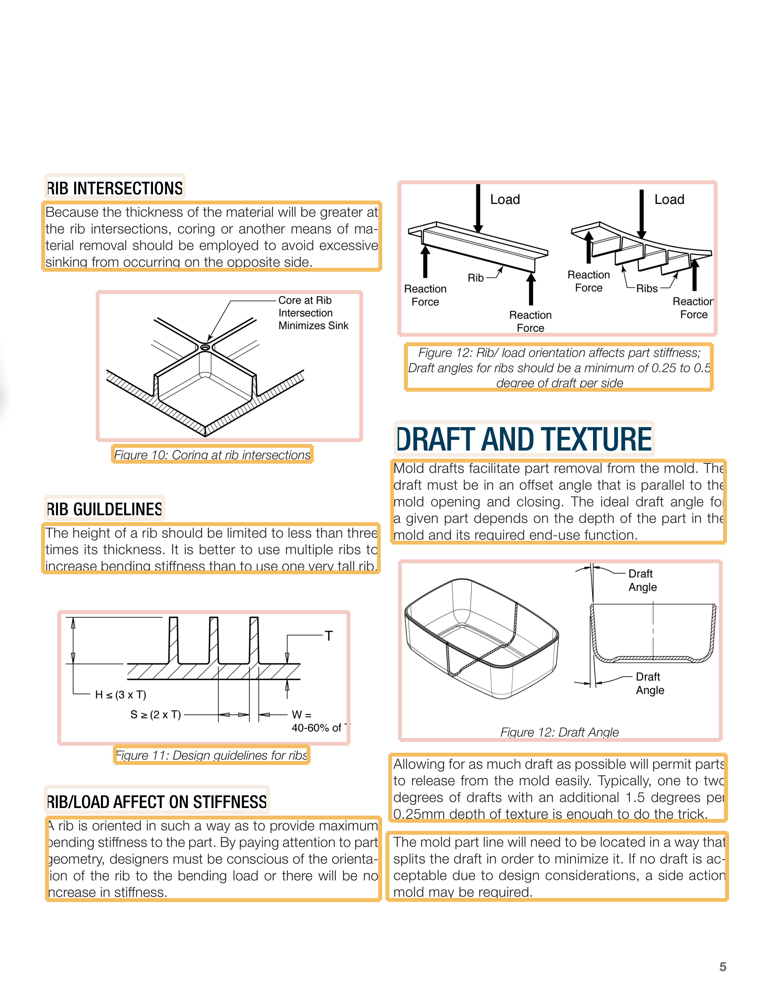

In [35]:

layout = model.detect(image) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
lp.draw_box(image, layout,)

In [36]:
text_blocks = lp.Layout([b for b in layout if b.type=="Text"])
figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])


def get_text_list(text_blocks):
  text_blocks = lp.Layout([b for b in text_blocks \
                    if not any(b.is_in(b_fig) for b_fig in figure_blocks)])
  h, w = image.shape[:2]

  left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

  left_blocks = text_blocks.filter_by(left_interval, center=True)
  left_blocks.sort(key = lambda b:b.coordinates[1])

  right_blocks = [b for b in text_blocks if b not in left_blocks]
  right_blocks.sort(key = lambda b:b.coordinates[1])

  # And finally combine the two list and add the index
  # according to the order
  text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

  lp.draw_box(image, text_blocks,
              box_width=3, 
              show_element_id=True)
  for block in text_blocks:
      segment_image = (block
                        .pad(left=5, right=5, top=5, bottom=5)
                        .crop_image(image))
          # add padding in each image segment can help
          # improve robustness 
          
      text = ocr_agent.detect(segment_image)
      block.set(text=text, inplace=True)
  text_list = []
  for txt in text_blocks.get_texts():
      print(txt, end='\n---\n')
      text_list.append(txt)
  return text_list
text_list = get_text_list(text_blocks)

A rib is oriented in such a way as to provide maximum
bending stiffness to the part. By paying attention to part
geometry, designers must be conscious of the orienta-
tion of the rio to the bending load or there will be no
increase in stiffness.

---
The height of a rio should be limited to less than three
times its thickness. It is better to use multiple ribs to
increase bending stiffness than to use one very tall rib.

---
Figure 10: Coring at rib intersections

---
Because the thickness of the material will be greater at
the rib intersections, coring or another means of ma-
terial removal should be employed to avoid excessive
sinking from occurring on the opposite side.

---
Figure 11: Design guidelines for ribs

---
Figure 12: Rib/ load orientation affects part stiffness;
Draft angles for rips should be a minimum of 0.25 to 0.5
degree of draft per side

---
Mold drafts facilitate part removal from the mold. The
draft must be in an offset angle that is parallel to the
mold ope

###Titles Extraction into List


In [37]:


def get_title_list():
  title_blocks = lp.Layout([b for b in layout if b.type=='Title'])

  h_1, w_1 = image.shape[:2]

  left_interval_1 = lp.Interval(0, w_1/2*1.05, axis='x').put_on_canvas(image)

  left_blocks_1 = title_blocks.filter_by(left_interval_1, center=True)
  left_blocks_1.sort(key = lambda b:b.coordinates[1], inplace=True)

  right_blocks_1 = [b for b in title_blocks if b not in left_blocks_1]
  right_blocks_1.sort(key = lambda b:b.coordinates[1])
  # And finally combine the two list and add the index
  # according to the order
  title_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks_1 + right_blocks_1)])

  lp.draw_box(image, title_blocks,
              box_width=3,
              show_element_id=True)
  for block in title_blocks:
      segment_image = (block
                        .pad(left=5, right=5, top=5, bottom=5)
                        .crop_image(image))
          # add padding in each image segment can help
          # improve robustness

      text_1 = ocr_agent.detect(segment_image)
      block.set(text=text_1, inplace=True)

  title_list = []
  for txt in title_blocks.get_texts():
      print(txt, end='\n---\n')
      title_list.append(txt)
  return title_list, title_blocks
title_list, title_blocks = get_title_list()


RIB INTERSECTIONS

---
RIB GUILDELINES

---
RIB/LOAD AFFECT ON STIFFNESS

---

---


###Extraction of Title and Paragraph 

In [71]:

def get_combined_list():
  para_title_blocks = lp.Layout([b for b in layout])

  h_2, w_2 = image.shape[:2]

  left_interval_2 = lp.Interval(0, w_2/2*1.05, axis='x').put_on_canvas(image)

  left_blocks_2 = para_title_blocks.filter_by(left_interval_2, center=True)
  left_blocks_2.sort(key = lambda b:b.coordinates[1], inplace=True)

  right_blocks_2 = [b for b in para_title_blocks if b not in left_blocks_2]
  right_blocks_2.sort(key = lambda b:b.coordinates[1])
  # And finally combine the two list and add the index
  # according to the order
  para_title_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks_2 + right_blocks_2)])

  lp.draw_box(image, para_title_blocks,
              box_width=3,
              show_element_id=True)
  for block in para_title_blocks:
      segment_image = (block
                        .pad(left=5, right=5, top=5, bottom=5)
                        .crop_image(image))
          # add padding in each image segment can help
          # improve robustness

      text_2 = ocr_agent.detect(segment_image)
      block.set(text=text_2, inplace=True)

  para_title_list = []
  for txt in para_title_blocks.get_texts():
      print(txt, end='\n---\n')
      para_title_list.append(txt)
  return para_title_list 
para_title_list = get_combined_list()

print(para_title_list)


RIB INTERSECTIONS

---
Because the thickness of the material will be greater at
the rib intersections, coring or another means of ma-
terial removal should be employed to avoid excessive
sinking from occurring on the opposite side.

---
    

Core at Rib
Intersection
Minimizes Sink

---
Figure 10: Coring at rib intersections

---
RIB GUILDELINES

---
The height of a rio should be limited to less than three
times its thickness. It is better to use multiple ribs to
increase bending stiffness than to use one very tall rib.

---
H <(3xT)

S >(2xT) W =
40-60% of 7

---
Figure 11: Design guidelines for ribs

---
RIB/LOAD AFFECT ON STIFFNESS

---
A rib is oriented in such a way as to provide maximum
bending stiffness to the part. By paying attention to part
geometry, designers must be conscious of the orienta-
tion of the rio to the bending load or there will be no
increase in stiffness.

---
   

   
 

Reaction
Force Ribs

Rib
Reaction

Force Reaction
Reaction Force

Force

---
F

In [39]:
#text_blocks.get_texts()
print(text_list)

['A rib is oriented in such a way as to provide maximum\nbending stiffness to the part. By paying attention to part\ngeometry, designers must be conscious of the orienta-\ntion of the rio to the bending load or there will be no\nincrease in stiffness.\n\x0c', 'The height of a rio should be limited to less than three\ntimes its thickness. It is better to use multiple ribs to\nincrease bending stiffness than to use one very tall rib.\n\x0c', 'Figure 10: Coring at rib intersections\n\x0c', 'Because the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c', 'Figure 11: Design guidelines for ribs\n\x0c', 'Figure 12: Rib/ load orientation affects part stiffness;\nDraft angles for rips should be a minimum of 0.25 to 0.5\ndegree of draft per side\n\x0c', 'Mold drafts facilitate part removal from the mold. The\ndraft must be in an offset angle 

In [40]:
text_list

['A rib is oriented in such a way as to provide maximum\nbending stiffness to the part. By paying attention to part\ngeometry, designers must be conscious of the orienta-\ntion of the rio to the bending load or there will be no\nincrease in stiffness.\n\x0c',
 'The height of a rio should be limited to less than three\ntimes its thickness. It is better to use multiple ribs to\nincrease bending stiffness than to use one very tall rib.\n\x0c',
 'Figure 10: Coring at rib intersections\n\x0c',
 'Because the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c',
 'Figure 11: Design guidelines for ribs\n\x0c',
 'Figure 12: Rib/ load orientation affects part stiffness;\nDraft angles for rips should be a minimum of 0.25 to 0.5\ndegree of draft per side\n\x0c',
 'Mold drafts facilitate part removal from the mold. The\ndraft must be in an offset 

In [41]:
para_title_list

['RIB INTERSECTIONS\n\x0c',
 'Because the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c',
 '    \n\nCore at Rib\nIntersection\nMinimizes Sink\n\x0c',
 'Figure 10: Coring at rib intersections\n\x0c',
 'RIB GUILDELINES\n\x0c',
 'The height of a rio should be limited to less than three\ntimes its thickness. It is better to use multiple ribs to\nincrease bending stiffness than to use one very tall rib.\n\x0c',
 'H <(3xT)\n\nS >(2xT) W =\n40-60% of 7\n\x0c',
 'Figure 11: Design guidelines for ribs\n\x0c',
 'RIB/LOAD AFFECT ON STIFFNESS\n\x0c',
 'A rib is oriented in such a way as to provide maximum\nbending stiffness to the part. By paying attention to part\ngeometry, designers must be conscious of the orienta-\ntion of the rio to the bending load or there will be no\nincrease in stiffness.\n\x0c',
 '   \n\n   \n \n\nReaction\nForce 

In [42]:
para_title_list

['RIB INTERSECTIONS\n\x0c',
 'Because the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c',
 '    \n\nCore at Rib\nIntersection\nMinimizes Sink\n\x0c',
 'Figure 10: Coring at rib intersections\n\x0c',
 'RIB GUILDELINES\n\x0c',
 'The height of a rio should be limited to less than three\ntimes its thickness. It is better to use multiple ribs to\nincrease bending stiffness than to use one very tall rib.\n\x0c',
 'H <(3xT)\n\nS >(2xT) W =\n40-60% of 7\n\x0c',
 'Figure 11: Design guidelines for ribs\n\x0c',
 'RIB/LOAD AFFECT ON STIFFNESS\n\x0c',
 'A rib is oriented in such a way as to provide maximum\nbending stiffness to the part. By paying attention to part\ngeometry, designers must be conscious of the orienta-\ntion of the rio to the bending load or there will be no\nincrease in stiffness.\n\x0c',
 '   \n\n   \n \n\nReaction\nForce 

In [131]:
def get_indexes(title_list, para_title_list):
   results = []
   for id, title in enumerate(title_list):
 
    a = title_list[id]
    if id == len(title_list)-1:
      b = 0
    else:
      b = title_list[id+1]

    if a in para_title_list:
        result_1 = para_title_list.index(a)
        # print(f"The {a} has an index of {result_1}.")
    else:
        continue
        # print(f"{a} doesn't exist in the list.")
    
    if b in para_title_list:
        result_2 = para_title_list.index(b)
        # print(f"The {b} has an index of {result_2}.")
    else:
        continue
        # print(f"{b} doesn't exist in the list.")
    results.append( [result_1, result_2, b])
    id = id+1
   return results
results = get_indexes(title_list, para_title_list)

In [132]:
# results = get_indexes(title_list, para_title_list)
results

[[0, 4, 'RIB GUILDELINES\n\x0c'],
 [4, 8, 'RIB/LOAD AFFECT ON STIFFNESS\n\x0c'],
 [8, 12, '\x0c']]

In [133]:
for i in results:
  print(i)

[0, 4, 'RIB GUILDELINES\n\x0c']
[4, 8, 'RIB/LOAD AFFECT ON STIFFNESS\n\x0c']
[8, 12, '\x0c']


In [142]:

correlations = []
#a = title 1
#b = title 2

def get_correlations(results):
    result_1= 0
    result_2 = 0
    b = 0
    result_1 = results[0]
    result_2 = results[1] 
    b = results[2] 
    print("result_1", result_1)
    print("result_2", result_2)

    for i_final , text in enumerate(para_title_list):
      l1 = [] 
      if result_1 < result_2 or b == 0:
        #print(para_title_list[i_final])
        #print(l1)
        while result_1 != result_2:
          l1.append(para_title_list[result_1])
          if i_final == len(para_title_list)-1:
            i_final = i_final+1
          else:
            ('done')
          result_1 += 1
          
        correlations.append(l1)
for result in results:
  get_correlations(result)


result_1 0
result_2 4
result_1 4
result_2 8
result_1 8
result_2 12


In [144]:
correlations[i+1][0]

['RIB INTERSECTIONS\n\x0c',
 'Because the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c',
 '    \n\nCore at Rib\nIntersection\nMinimizes Sink\n\x0c',
 'Figure 10: Coring at rib intersections\n\x0c']

In [ ]:

correlations = []
#a = title 1
#b = title 2
def get_correlations(title_list, para_title_list):
  for id, title in enumerate(title_list):
    a = title_list[id]
    if id == len(title_list)-1:
      b = 0
    else:
      b = title_list[id+1]
      print("a",  a, "b",b)
 
    if a in para_title_list:
        result_1 = para_title_list.index(a)
        print(f"The {a} has an index of {result_1}.")
    else:
        continue
        print(f"{a} doesn't exist in the list.")

    if b in para_title_list:
        result_2 = para_title_list.index(b)
        print(f"The {b} has an index of {result_2}.")
    else:
        continue
        print(f"{b} doesn't exist in the list.")

    l1 = [] 
    for i_final , text in enumerate(para_title_list):
      if result_1 < result_2 or b == 0:
        #print(para_title_list[i_final])
        #print(l1)
        while result_1 != result_2:
          l1.append(para_title_list[result_1])
          if i_final == len(para_title_list)-1:
            i_final = i_final+1
          else:
            ('done')
          result_1 += 1
      correlations.append(l1)

get_correlations(title_list, para_title_list)


In [61]:
text = correlations[0][0] + correlations[0][1] + correlations[0][2] + correlations[0][3]
text

'RIB INTERSECTIONS\n\x0cBecause the thickness of the material will be greater at\nthe rib intersections, coring or another means of ma-\nterial removal should be employed to avoid excessive\nsinking from occurring on the opposite side.\n\x0c    \n\nCore at Rib\nIntersection\nMinimizes Sink\n\x0cFigure 10: Coring at rib intersections\n\x0c'

In [50]:

correlations = []
def get_correlations(title_list, para_title_list):
  for id, title in enumerate(title_list):
    a = title_list[id]
    if id == len(title_list)-1:
      b = 0
    else:
      b = title_list[id+1]
   
 
    if a in para_title_list:
        result_1 = para_title_list.index(a)
        print(f"The {a} has an index of {result_1}.")
    else:
        result_1 = 0
        print(f"{a} doesn't exist in the list.")

    if b in para_title_list:
        result_2 = para_title_list.index(b)
        print(f"The {b} has an index of {result_2}.")
    else:
        result_2 = 0
        print(f"{b} doesn't exist in the list.")

    l1 = [] 
    for i_final in para_title_list:
      if result_1 < result_2 or b == 0:
        print(para_title_list[result_1])
        l1.append(para_title_list[result_1])
        result_1 = result_1+1
    else:
      ('done')
    correlations.append(l1)



In [ ]:
c = title_list[1]
d = title_list[2]

if a in para_title_list:
    result_3 = para_title_list.index(c)
    print(f"The {c} has an index of {result_3}.")
else:
    print(f"{c} doesn't exist in the list.")

if d in para_title_list:
    result_4 = para_title_list.index(d)
    print(f"The {d} has an index of {result_4}.")
else:
    print(f"{d} doesn't exist in the list.")


l_1_2=[]
for i_final in para_title_list:
  if result_3 < result_4:
    print(para_title_list[result_3])
    l_1_2.append(para_title_list[result_3])
    result_3 = result_3+1
  else:
    ('done')


The INJECTION MOLDING
 has an index of 2.
The NJECTION MOLDED PARTS
 has an index of 3.
INJECTION MOLDING



In [ ]:
######################################################

In [ ]:
c = title_list[1]
d = title_list[2]

if a in para_title_list:
    result_3 = para_title_list.index(c)
    print(f"The {c} has an index of {result_3}.")
else:
    print(f"{c} doesn't exist in the list.")

if d in para_title_list:
    result_4 = para_title_list.index(d)
    print(f"The {d} has an index of {result_4}.")
else:
    print(f"{d} doesn't exist in the list.")

###################


l_1_2=[]
for i_final in para_title_list:
  if result_3 < result_4:
    print(para_title_list[result_3])
    l_1_2.append(para_title_list[result_3])
    result_3 = result_3+1
  else:
    ('done')


The RIB GUILDELINES
 has an index of 4.
The RIB/LOAD AFFECT ON STIFFNESS
 has an index of 8.
RIB GUILDELINES

The height of a rib should be limited to less than three
times its thickness. It is better to use multiple ribs to
increase bending stiffness than to use one very tall rib.

4

 

 

 

— H<(3xT)

 

 

S$ 2(2xT)

 

[
Ct

40-60% of T

Figure 11: Design guidelines for ribs



In [ ]:
d=1

In [ ]:
para_title_list[d]

# Merging everything

In [18]:
!pip install fitz
!pip install --upgrade pymupdf
!pip install pdf2image
!apt-get install poppler-utils


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 78 kB 7.8 MB/s 
     |████████████████████████████████| 3.2 MB 42.2 MB/s 
     |████████████████████████████████| 5.1 MB 59.8 MB/s 
     |████████████████████████████████| 130 kB 45.1 MB/s 
     |████████████████████████████████| 421 kB 73.7 MB/s 
     |████████████████████████████████| 482 kB 65.3 MB/s 
     |████████████████████████████████| 41 kB 671 kB/s 
     |████████████████████████████████| 6.4 MB 56.6 MB/s 
  Created wheel for configobj: filename=configobj-5.0.6-py3-none-any.whl size=34547 sha256=1972bc3838f7ccb16b88914c275024f9ffa23882624dc692d3a26d24b08a09cf
  Stored in directory: /root/.cache/pip/wheels/0d/c4/19/13d74440f2a571841db6b6e0a273694327498884dafb9cf978
  Created wheel for pyxnat: filename=pyxnat-1.4-py3-none-any.whl size=92687 sha256=7e6076e251b7ccb3a552136c15a7bc544b5db799dfc0dff427cde6e0f8b5bf2d
  Stored in directory: /root/.

In [ ]:
import os
import fitz
from tqdm import tqdm

def extract_images():
  #A folder containing all pdfs
  workdir = "/content/drive/MyDrive/HCLOCR/PDFs"

  for each_path in os.listdir(workdir):
      if ".pdf" in each_path:
          new_dir2 = each_path.rsplit('.', 1)[0] + '/' + 'images'
          try:
            os.makedirs(os.path.join(workdir, new_dir2))
          except FileExistsError:
        # Handle the case where the target dir already exist.
            pass
       
          doc = fitz.Document((os.path.join(workdir, each_path)))
          j=0
          for i in tqdm(range(len(doc)), desc="pages"):
              for img in tqdm(doc.get_page_images(i), desc="page_images"):
                  xref = img[0]
                  image = doc.extract_image(xref)
                  pix = fitz.Pixmap(doc, xref)
                  pix.save(os.path.join(workdir + '/' + new_dir2, "p%s-i%s.png" % (i,j)))
                  j= j+1
              j = 0
  os.system('readlink -f %s/* > %s/images.txt'% (new_dir2, new_dir2))
  os.chdir(workdir)

In [ ]:
extract_images()

page_images: 100%|██████████| 1/1 [00:00<00:00, 27.60it/s]

page_images: 100%|██████████| 1/1 [00:00<00:00, 51.51it/s]

page_images: 100%|██████████| 4/4 [00:00<00:00, 14.64it/s]

page_images: 100%|██████████| 2/2 [00:00<00:00, 26.98it/s]

pages: 100%|██████████| 8/8 [00:01<00:00,  4.24it/s]


{
  "1": {
        "TEXT": [], "Titles": [], "Combined": [],  "images": []}
}
{
  "1": {"Titl1": {"text": [texts], "table": [table_loc], "image": [image_loc]}}
}


KeyError: ignored

In [ ]:
import os
import cv2
pages = {}
attributes = {}
correlations = []
#correlations = 
{}

for id, image in enumerate(os.listdir('/content/drive/MyDrive/HCLOCR')):
  image = '/content/drive/MyDrive/HCLOCR' + '/'+ image
  image = cv2.imread(image)
  layout = model.detect(image) # You need to load the image somewhere else, e.g., image = cv2.imread(...)
  lp.draw_box(image, layout,)
  text_blocks = lp.Layout([b for b in layout if b.type=="Text"])
  figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])
  text_list = get_text_list(text_blocks)
  title_list = get_title_list()
  combined_list = get_combined_list()
  get_correlations(title_list, para_title_list)
  
  pages[f'Page_{id}'] = {'Texts' : text_list,
               'Titles': title_list, 
               'Combined': combined_list,
               'correlations': correlations}
#correlations['correlation'] = correlations
  


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


Injection molding is used for manufacturing a wide variety of parts, from
small components like AAA battery boxes to large components like truck
body panels. Once a component is designed, a mold is made and preci-
sion machined to form the features of the desired part. The injection mold-
ing takes place when a thermoplastic or thermoset plastic material is fec
into a heated barrel, mixed, and forced into the metal mold cavity where |
cools and hardens before being removed.

---
Mold and die are used interchangeably to describe the tooling applied to
produce plastic parts. They are typically constructed from pre-hardened
steel, hardened steel, aluminum, and/or beryllium-copper alloy. Of these
materials, hardened steel molds are the most expensive to make, but offer
the user a long lifespan, which offsets the cost per part by spreading it over
a larger quantity. For low volumes or large components, pre-hardened steel
molds provide a less wear-resistant and less expensive option.

---


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


screw turns so that the next shot is moved into a ready
position, and the barrel retracts as the next shot is heated.
Because the mold is kept cold, the plastic solidifies soon
after the mold is filled. Once the part inside the mold cools
completely, the mold opens, and the part is ejected. The
next injection molding cycle starts the moment the mold
closes and the polymer is injected into the mold cavity.

---
Materials Selection: Many types of thermoplastic ma
terials are available. Selection depends on the specifi
application. The chart below shows some of the mos
common materials being used.

---
Cost savings are highest when components have a
mini-mum wall thickness, as long as that thickness is
con-sistent with the part’s function and meets all mold
filling considerations. As would be expected, parts cool
faster with thin wall thicknesses, which means that
cycle times are shorter, resulting in more parts per hour.
Further, thin parts weigh less, using less plastic per part.
On a

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


Gussets are support structures that can be designec
into the part to reduce the possibility of warping.

---
If design limitations make it impossible to have uniform
wall thicknesses, the change in thickness should be as
gradual as possible.

---
Figure 2: Transition of wall thickness

---
Figure 3: Coring to eliminate sinks

---
Coring is a method where plastic is removed from the
thick area, which helos to keep wall sections uniform,
eliminating the problem altogether.

---
Figure 4: Gusseting to reduce warping

---
Troublesome shrinkage problems can be caused by the
intersection of walls that are not uniform in wall thick-
ness. Examples might include ribs, bosses, or any other
projection of the nominal wall. Since thicker walls solidify
slower, the area they are attached to at the nominal wall
will shrink as the projection shrinks. This can result in
a sunken area in the nominal wall. Such shrinkage can
be minimized if a rib thickness is maintained to between
50 and 60 percen

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


A rib is oriented in such a way as to provide maximum
bending stiffness to the part. By paying attention to part
geometry, designers must be conscious of the orienta-
tion of the rio to the bending load or there will be no
increase in stiffness.

---
The height of a rio should be limited to less than three
times its thickness. It is better to use multiple ribs to
increase bending stiffness than to use one very tall rib.

---
Figure 10: Coring at rib intersections

---
Because the thickness of the material will be greater at
the rib intersections, coring or another means of ma-
terial removal should be employed to avoid excessive
sinking from occurring on the opposite side.

---
Figure 11: Design guidelines for ribs

---
Figure 12: Rib/ load orientation affects part stiffness;
Draft angles for rips should be a minimum of 0.25 to 0.5
degree of draft per side

---
Mold drafts facilitate part removal from the mold. The
draft must be in an offset angle that is parallel to the
mold ope

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


Wall thicknesses for bosses should be less than 60 per-
cent of the nominal wall to minimize sinking. However,
if the boss is not in a visible area, then the wall thick-
ness can be increased to allow for increased stresses
imposed by self-tapping screws.

---
Bosses are used to facilitate the registration of mating
parts, for attaching fasteners such as screws, or for ac-
cepting threaded inserts.

---
The base radius should be a minimum of 0.25 X thick-
ness. Bosses can be strengthened by incorporating gus-
sets at the base or by using connecting ribs attaching to
nearby walls.

---
Figure 8: Boss strengthening technique

---
Figure 7: Boss design guidelines

---
Rios are used in a design to increase the bending stiff-
ness of a part without adding thickness. Ribs increase
the moment of inertia, which increases the bending
stiffness.

---
Rib thickness should be less than wall thickness to min-
imize sinking effects. The recommended rib thickness
should not exceed 60 percent of

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


Draft for texturing is somewhat dependent on the part
design and specific texture desired. As a general guide-
line, 1.5° min. per 0.025mm (0.001 inch) depth of tex-
ture needs to be allowed for in addition to the normal
draft. Usually for general office equipment such as lap-
top computers a texture depth of 0.025 mm (0.001 inch)
is used and the minimum draft recommended is 1.5°.
More may be needed for heavier textured Surfaces such
as leather (with a depth of 0.125 mm/0.005 inch) that
requires a minimum draft of 7.5°.

---
Whether to incorporate identifying information or to in-
clude as an aesthetic addition, textures and lettering can
be included onto mold surfaces for the end user or fac-
tory purposes. Texturing may also hide surface defects
such as knit lines and other imperfections. The depth of
the texture or letters is somewhat limited, and extra draft
needs to be provided to allow for part removal from the
mold without dragging or marring the part.

---
Sharp corners great

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


This process is used to hollow out thick sections of a
part where coring Is not an option and sink is not accept-
able. Gas assist molding can be applied to almost any
thermoplastic, and most conventional molding machines
can be adapted for gas assist molding.

---
Figure 18: Gas Assist Molding

---
The overmolding process is when a flexible material is
molded onto a more rigid material called a substrate. If
properly selected, the overmolded (flexible material) will
form a strong bond with the substrate. Bonding agents
are no longer required to achieve optinum bond be-
tween the substrate and overmold.

---
The most widely used overmolding process is insert
molding. This is where a pre-molded substrate is placed
into a mold and the flexible material is shot directly over
it. The advantage of this process is that conventional,
single shot injection molding machines can be used.

---
This is a multi-material overmolding process that requires
a special injection molding machine that 

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


This method uses a heated tool, like a soldering iron,
to first heat the insert until it melts the plastic, and then
presses the insert into place. As the plastic cools it
shrinks around the insert, capturing it. The advantage
of this method is that the special tooling is inexpensive
and simple to use. Care does need to be taken not to
overheat the insert or plastic, which could result in a non-
secure fit and degradation of the plastic.

---
Ultrasonic insertion is when an insert Is “vibrated” into
place by using an ultrasonic transducer called the “horn”
that is mounted into the ultrasonic device. For optimum
performance, the horn is specially designed for each ap-
plication. Ultrasonic energy is converted to thermal en-
ergy by the vibrating action, which allows the insert to be
melted into the hole. This type of insertion can be done
rapidly, with short cycle times, and low residual stresses.
Good melt flow characteristics for the plastic is neces-
sary for the process to be succe

AttributeError: ignored

In [ ]:
!pip install jsonpickle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import json
import jsonpickle
import codecs
encoded_data = jsonpickle.encode(pages)
with open('distance_data_scaled_sig', 'w') as fp:
  
  json.dump(encoded_data, codecs.open('/content/drive/MyDrive/HCLOCR/metadata.json', 'w', encoding='utf-8'), 
          separators=(',', ':'), 
          sort_keys=True, 
          indent=4)
print("Data Dumped")


Data Dumped


In [57]:
correlations[0][0]

'RIB INTERSECTIONS\n\x0c'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.8 MB 20.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 154 kB of archives.
After this operation, 613 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 poppler-utils amd64 0.62.0-2ubuntu2.12 [154 kB]
Fetched 154 kB in 1s (151 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 155653 files and directories currently installed.)
Preparing to u

In [ ]:
import os
import fitz
from tqdm import tqdm

def extract_images():
  #A folder containing all pdfs
  workdir = "/content"

  for each_path in os.listdir(workdir):
      if ".pdf" in each_path:
          new_dir2 = each_path.rsplit('.', 1)[0] + '/' + 'images'
          try:
            os.makedirs(os.path.join(workdir, new_dir2))
          except FileExistsError:
        # Handle the case where the target dir already exist.
            pass
       
          doc = fitz.Document((os.path.join(workdir, each_path)))
          j=0
          for i in tqdm(range(len(doc)), desc="pages"):
              for img in tqdm(doc.get_page_images(i), desc="page_images"):
                  xref = img[0]
                  image = doc.extract_image(xref)
                  pix = fitz.Pixmap(doc, xref)
                  pix.save(os.path.join(workdir + '/' + new_dir2, "p%s-i%s.png" % (i,j)))
                  j= j+1
              j = 0
  os.system('readlink -f %s/* > %s/images.txt'% (new_dir2, new_dir2))
  os.chdir(workdir)

In [ ]:
!rm -rf /content/Inj*

page_images: 100%|██████████| 1/1 [00:00<00:00, 36.98it/s]

page_images: 100%|██████████| 1/1 [00:00<00:00, 76.42it/s]

page_images: 100%|██████████| 4/4 [00:00<00:00, 16.50it/s]

page_images: 100%|██████████| 2/2 [00:00<00:00, 31.60it/s]

pages: 100%|██████████| 8/8 [00:01<00:00,  5.02it/s]
